# DL Project | Dating Historical Fashion

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

## Load Dataset(s)

In [2]:
dir_location = Path("datasets")

all_data = pd.read_csv(dir_location / "all.csv")
all_data.head(5)

,year,file
0,1844,datasets/public/1840/1844_33washington.jpg
1,1839,datasets/public/1830/1839_2663vna.jpg
2,1824,datasets/private/1820/1824_034_Zrzut ekranu 20...
3,1845,datasets/public/1840/1845_2691vna.jpg
4,1823,datasets/public/1820/1823_2530vna.jpg


### Display 3 images in dataset with different versions

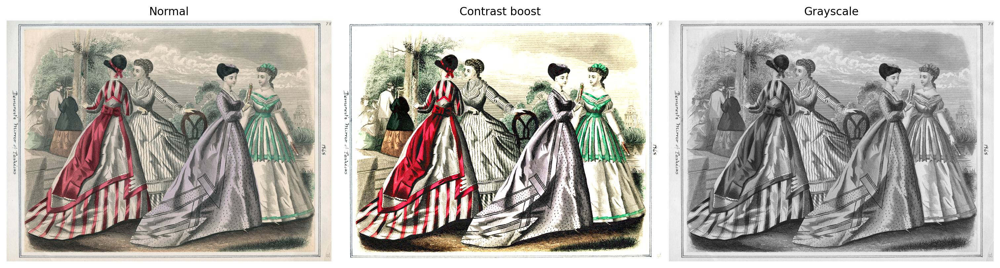

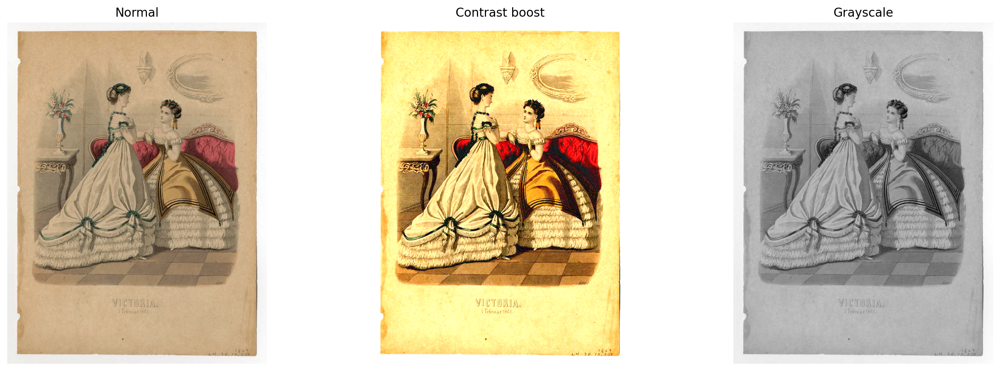

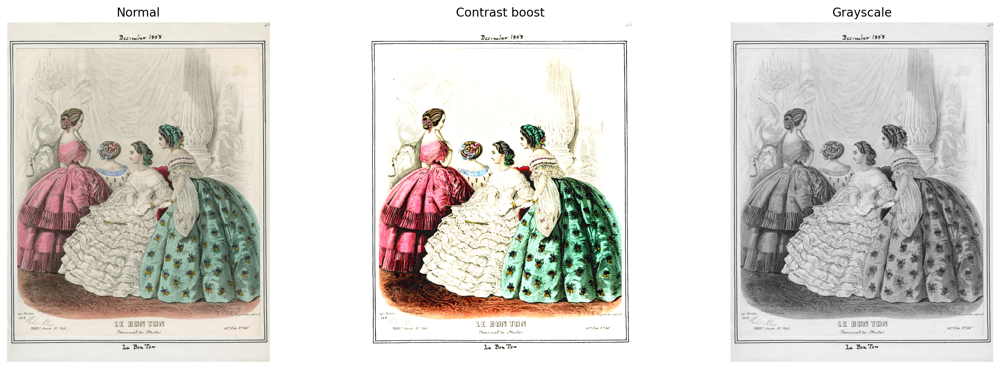

In [ ]:
# file_list = all_data.head(3)["file"]
file_list = all_data.sample(3, random_state=41)["file"]
for value in file_list:
    img_path = Path() / value
    # print(img_path)

    fig, ax = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True, dpi=200)  # 1 row, 3 columns

    img = mpimg.imread(img_path)

    # -----------------CONTRAST----------------------
    # Convert to float for manipulation
    img_contrast = img.astype(np.float32) / 255.0

    # Apply contrast only to brighter pixels
    boost_threshold = 0.2 # Threshold of 1 gives the original image
    mask = img_contrast > boost_threshold # only boost pixels not too dark

    # # Boost contrast per channel
    factor = 2.5
    img_contrast[mask] = np.clip((img_contrast[mask] - 0.5) * factor + 0.5, 0, 1)
    # -----------------CONTRAST----------------------

    # -----------------GRAYSCALE----------------------
    # Convert to grayscale manually (using standard luminosity weights)
    gray = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])
    # plt.imshow(gray, cmap='gray')
    # -----------------GRAYSCALE----------------------

    # Show first image
    ax[0].imshow(img)  # Use cmap='gray' if grayscale
    ax[0].set_title("Normal")
    ax[0].axis('off')  # Hide axis
    # ax[0].set_aspect('auto')  # this allows height to stretch
    
    # Show second image
    ax[1].imshow(img_contrast)  # Use cmap='gray' if grayscale
    ax[1].set_title("Contrast boost")
    ax[1].axis('off')  # Hide axis

    # Show third image
    ax[2].imshow(gray, cmap='gray')
    ax[2].set_title("Grayscale")
    ax[2].axis('off')
    
    plt.show()

## Image Segmentation

In [16]:
import os

# input_dir = "images/"
target_dir = "datasets/segmented_images/"
img_size = (224, 224)
num_classes = 3
batch_size = 32

file_list = all_data.copy()['file'].to_numpy().tolist()


# input_img_paths = sorted(
#     [
#         os.path.join(input_dir, fname)
#         for fname in os.listdir(input_dir)
#         if fname.endswith(".jpg")
#     ]
# )
target_img_paths = sorted(
    [
        os.path.join(target_dir, fname)
        for fname in os.listdir(target_dir)
        if fname.endswith(".png") and not fname.startswith(".")
    ]
)

print("Number of samples:", len(file_list))

for input_path, target_path in zip(file_list[:10], target_img_paths[:10]):
    print(input_path, "|", target_path)

Number of samples: 12559


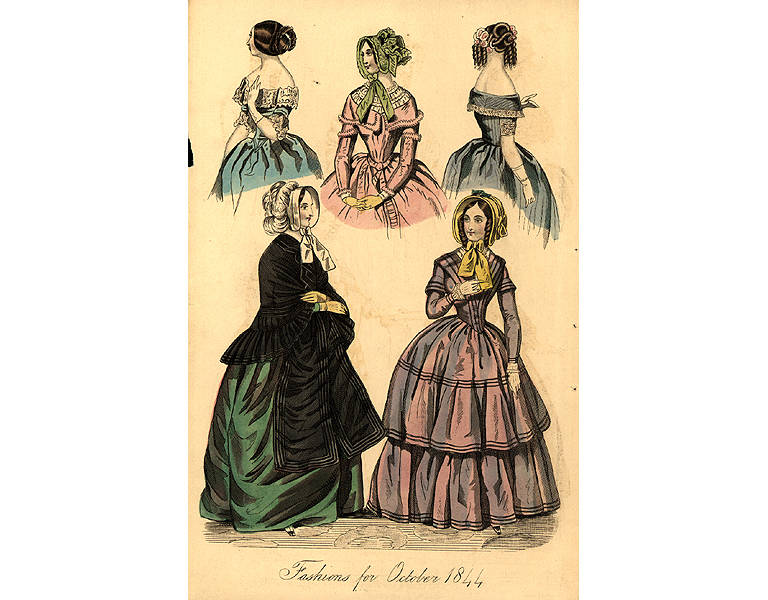

IndexError: list index out of range

In [13]:
from IPython.display import Image, display
from keras.utils import load_img
from PIL import ImageOps

# file_list = all_data.sample(3, random_state=41)["file"]
# print(file_list)
# for value in file_list:
img_path = Path() / file_list[0]
# img_path = Path() / value

# Display input image #7
display(Image(filename=img_path))

# Display auto-contrast version of corresponding target (per-pixel categories)
img = ImageOps.autocontrast(load_img(target_img_paths[0]))
display(img)

### Prepare dataset to load & vectorize batches of data

In [ ]:
import keras
import numpy as np
from tensorflow import data as tf_data
from tensorflow import image as tf_image
from tensorflow import io as tf_io


def get_dataset(
    batch_size,
    img_size,
    input_img_paths,
    target_img_paths,
    max_dataset_len=None,
):
    """Returns a TF Dataset."""

    def load_img_masks(input_img_path, target_img_path):
        input_img = tf_io.read_file(input_img_path)
        input_img = tf_io.decode_png(input_img, channels=3)
        input_img = tf_image.resize(input_img, img_size)
        input_img = tf_image.convert_image_dtype(input_img, "float32")

        target_img = tf_io.read_file(target_img_path)
        target_img = tf_io.decode_png(target_img, channels=1)
        target_img = tf_image.resize(target_img, img_size, method="nearest")
        target_img = tf_image.convert_image_dtype(target_img, "uint8")

        # Ground truth labels are 1, 2, 3. Subtract one to make them 0, 1, 2:
        target_img -= 1
        return input_img, target_img

    # For faster debugging, limit the size of data
    if max_dataset_len:
        input_img_paths = input_img_paths[:max_dataset_len]
        target_img_paths = target_img_paths[:max_dataset_len]
    dataset = tf_data.Dataset.from_tensor_slices((input_img_paths, target_img_paths))
    dataset = dataset.map(load_img_masks, num_parallel_calls=tf_data.AUTOTUNE)
    return dataset.batch(batch_size)

### Prepare U-Net Xception-style model

In [18]:
from keras import layers

def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model


# Build model
model = get_model(img_size, num_classes)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_9 (Conv2D)              (None, 112, 112, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_15 (BatchN  (None, 112, 112, 32  128        ['conv2d_9[0][0]']               
 ormalization)                  )                                                           

### Set aside a validation split

In [ ]:
import random

# Split our img paths into a training and a validation set
val_samples = 1000
random.Random(1337).shuffle(file_list)
random.Random(1337).shuffle(target_img_paths)
train_input_img_paths = file_list[:-val_samples]
train_target_img_paths = target_img_paths[:-val_samples]
val_input_img_paths = file_list[-val_samples:]
val_target_img_paths = target_img_paths[-val_samples:]

# Instantiate dataset for each split
# Limit input files in `max_dataset_len` for faster epoch training time.
# Remove the `max_dataset_len` arg when running with full dataset.
train_dataset = get_dataset(
    batch_size,
    img_size,
    train_input_img_paths,
    train_target_img_paths,
    max_dataset_len=100,
)
valid_dataset = get_dataset(
    batch_size, 
    img_size,
    val_input_img_paths,
    val_target_img_paths
)

### Train the model

In [ ]:
# Configure the model for training.
# We use the "sparse" version of categorical_crossentropy
# because our target data is integers.
model.compile(
    optimizer=keras.optimizers.Adam(1e-4), loss="sparse_categorical_crossentropy"
)

callbacks = [
    keras.callbacks.ModelCheckpoint("oxford_segmentation.keras", save_best_only=True)
]

# Train the model, doing validation at the end of each epoch.
epochs = 10
model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=valid_dataset,
    callbacks=callbacks,
    verbose=2,
)

### Import Keras models

In [4]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array

## InceptionV3 implementation

In [5]:
# Instantiates InceptionV3 model architecture
base_model = InceptionV3(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax"
)



87910968/87910968 [==============================] - 9s 0us/step


In [6]:
base_model.trainable = False

num_classes = len(all_data["year"].unique())

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')  # Adjust num_classes
])


In [33]:
class ImageCSVGenerator(Sequence):
    def __init__(self, df, batch_size=32, img_size=(299, 299), shuffle=True, label_column='label'):
        self.df = df.reset_index(drop=True)
        self.batch_size = batch_size
        self.img_size = img_size
        self.shuffle = shuffle
        self.label_column = label_column
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))

    def on_epoch_end(self):
        self.indices = np.arange(len(self.df))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_df = self.df.iloc[batch_indices]

        X = np.zeros((len(batch_df), *self.img_size, 3), dtype=np.float32)
        y = np.zeros(len(batch_df), dtype=np.int32)

        for i, (_, row) in enumerate(batch_df.iterrows()):
            img = load_img(row['file'], target_size=self.img_size)
            X[i] = img_to_array(img) / 255.0
            y[i] = row[self.label_column]

        return X, y


In [34]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
all_data['label'] = le.fit_transform(all_data['year'])  # e.g., 1890 → 0, 1920 → 1, etc.

df_train, df_val = train_test_split(all_data, test_size=0.2, stratify=all_data['year'])

train_generator = ImageCSVGenerator(df_train, batch_size=32, label_column='label')

val_generator = ImageCSVGenerator(df_val, batch_size=32, label_column='label')

In [35]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [36]:
model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10
)

Epoch 1/10
314/314 [==============================] - 491s 2s/step - loss: 2.7413 - accuracy: 0.2811 - val_loss: 2.0843 - val_accuracy: 0.4566
Epoch 2/10
314/314 [==============================] - 465s 1s/step - loss: 2.1160 - accuracy: 0.4099 - val_loss: 1.7470 - val_accuracy: 0.5255
Epoch 3/10
314/314 [==============================] - 481s 2s/step - loss: 1.8595 - accuracy: 0.4674 - val_loss: 1.6241 - val_accuracy: 0.5334
Epoch 4/10
 45/314 [===>..........................] - ETA: 5:47 - loss: 1.7321 - accuracy: 0.4771

KeyboardInterrupt: 

#### Plot model performance

In [ ]:
plt.plot(model.history['loss'], label="Training loss")
plt.plot(model.history['val_loss'], label="Validation loss")
plt.plot(model.history['mae'], label="Training MAE")
plt.plot(model.history['val_mae'], label="Validation loss")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.show()

In [ ]:
# train_datagen = ImageDataGenerator(
#     preprocessing_function=preprocess_input,
#     validation_split=0.2
# )

# train_generator = train_datagen.flow_from_directory(
#     './datasets',
#     target_size=(299, 299),
#     batch_size=32,
#     class_mode='categorical',
#     subset='training'
# )

# val_generator = train_datagen.flow_from_directory(
#     './datasets',
#     target_size=(299, 299),
#     batch_size=32,
#     class_mode='categorical',
#     subset='validation'
# )

## Training, Validation and Test splits

## Replace the following functions:

In [ ]:
def build_model(base, lr=LR):
    x = GlobalAveragePooling2D()(base.output)
    out = Dense(1)(x)   # regression head

    model = Model(base.input, out)
    print(model.summary())
    model.compile(optimizer=Adam(lr), loss='mse', metrics=['mae'])
    return model

## New use_model function:

In [ ]:
def use_model(base, model_name):
    # models = ['resnet101','nasnetmobile','inceptionv3']
    best_results = {'training': None, 'validation': None, 'test': None}
    
    TEST_FOLD = 9

    test_df = pd.read_csv(os.path.join(DATA_DIR, f'fold{TEST_FOLD}.csv'))

    for val_fold in range(9):
        # Load the CSVs from DATA_DIR
        val_df   = pd.read_csv(os.path.join(DATA_DIR, f'fold{val_fold}.csv'))
        train_df = pd.concat([
            pd.read_csv(os.path.join(DATA_DIR, f'fold{i}.csv'))
            for i in range(9) if i != val_fold
        ], ignore_index=True)

        # Strip leading 'datasets/' so paths are RELATIVE to DATA_DIR
        for df in (train_df, val_df, test_df):
            df['file'] = df['file'].str.replace(
                r'^datasets[\\/]', '', regex=True
            )

        # Build tf.data pipelines
        train_ds = make_dataset(train_df, training=True)
        val_ds   = make_dataset(val_df, training=False)
        test_ds  = make_dataset(test_df, training=False)

        # Train & checkpoint
        model = build_model(base)
        ckpt = tf.keras.callbacks.ModelCheckpoint(
            f'{model_name}_fold{val_fold}.h5',
            monitor='val_loss', save_best_only=True
        )

        # Train and validate
        hist = model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=EPOCHS,
            callbacks=[ckpt],
            verbose=2
        )

        train_loss = hist.history['loss']
        val_loss = hist.history['val_loss']

        # Get best scores
        best_train = min(train_loss)
        best_val = min(val_loss)

        # Save scores
        if best_train > best_results['training']:
            best_results['training'] = best_train
    
        if best_val > best_results['validation']:
            best_results['validation'] = best_val

        print(f' Fold {val_fold} → best train_mse: {best_train:.4f}')
        print(f' Fold {val_fold} → best val_mse: {best_val:.4f}')

    # Evaluate on test set
    eval = model.evaluate(test_ds)

    best_results['test'] = eval

    return best_results['training'], best_results['validation'], best_results['test']

# Final code block

(How to use it)

In [ ]:
models = ['resnet101','nasnetmobile','inceptionv3']
results = {m: [] for m in models}

for model_name in models:
    if model_name == 'resnet101':
        base = ResNet101(include_top=False, weights='imagenet',
                         input_shape=(*INPUT_SIZE, 3))
    elif model_name == 'nasnetmobile':
        base = NASNetMobile(include_top=False, weights='imagenet',
                            input_shape=(*INPUT_SIZE, 3))
    elif model_name == 'inceptionv3':
        base = InceptionV3(include_top=False, weights='imagenet',
                           input_shape=(*INPUT_SIZE, 3))
    else:
        raise ValueError(f'Unknown model: {model_name}')
    
    print(base.summary())
    print(f'\n=== {model_name} ===')

    # ============================================================

    best_train_score, best_val_score, best_test_score = use_model(base, model_name)
    print(best_train_score)
    print(best_val_score)

    # Save test score
    results[model_name].append(best_test_score)


    # ============================================================
    
print('\nCV MSE per model:')
for m, vals in results.items():
    print(f' {m}:', [f'{v:.4f}' for v in vals])

pd.DataFrame(results).to_csv('cv_results.csv', index=False)

